<a href="https://colab.research.google.com/github/ABdulZak/ML/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐕 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image
classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem
Identify the breed of a dog given an image of a 120 different dogs

## 2. Data
The data we're using is from Kaggle's dog breed identification competition

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features
Some information about the data:
* We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (this images have labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Unzip files in Google Drive
# !unzip -u "/content/drive/MyDrive/Colab Notebooks/Dog vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog vision"

## Get our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow Hub ✅
* Make sure we're using a GPU ✅

In [3]:
# import Tensorflow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU avaiability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.9.2
TF Hub version:  0.12.0
GPU available


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations) 

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Dog vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


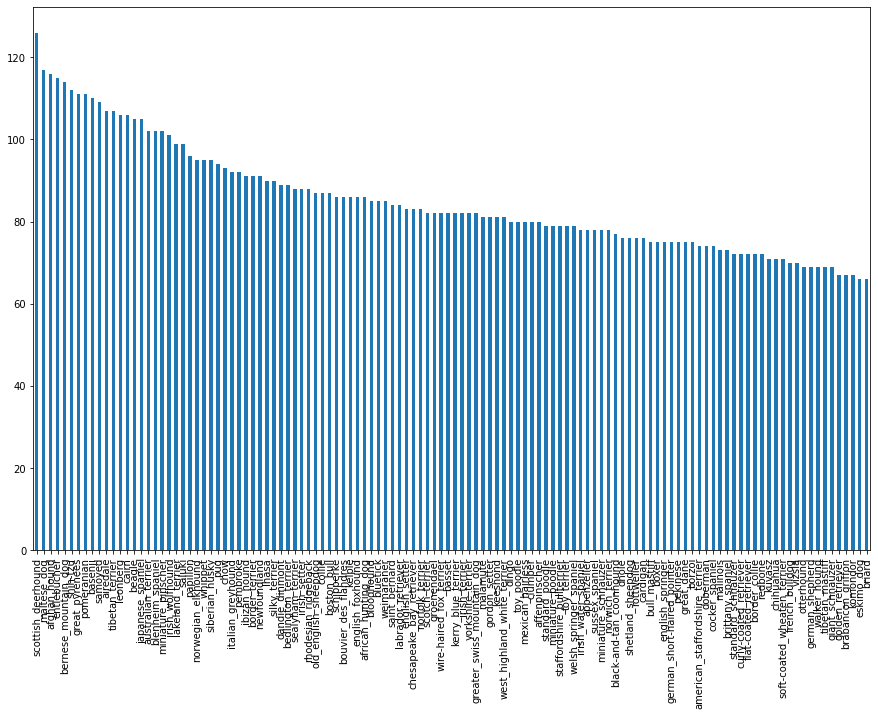

In [5]:
labels_csv['breed'].value_counts().plot(kind='bar', figsize=(15,10))

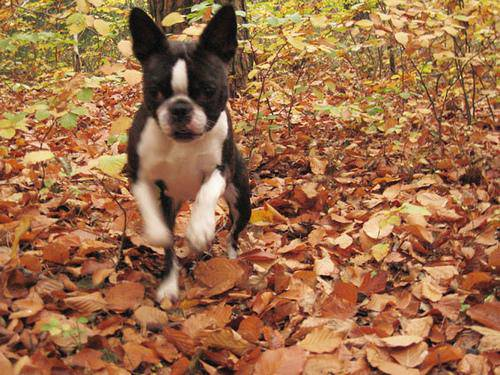

In [6]:
from IPython.display import Image
Image('/content/drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [7]:
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog vision/train/" + fname + ".jpg" for fname in labels_csv['id']]

filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether the number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog vision/train")) == len(filenames):
  print("Yes")
else:
  print("No")

Yes


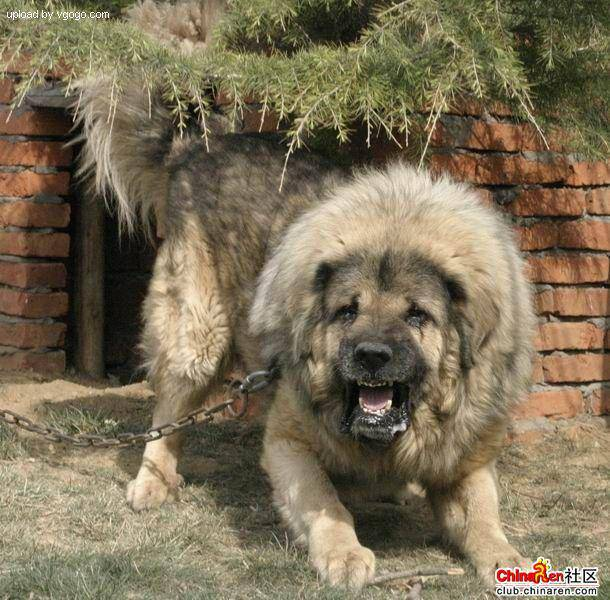

In [9]:
Image(filenames[9000])

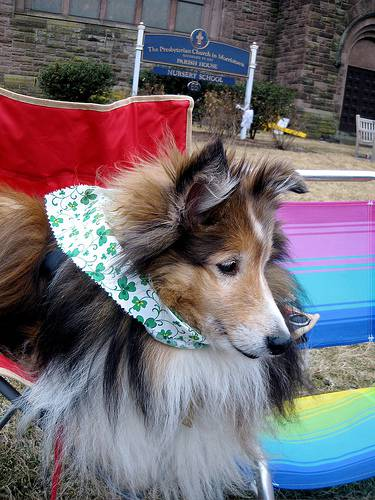

In [10]:
Image(filenames[10])

In [11]:
labels_csv['breed'][10]

'shetland_sheepdog'

In [12]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
len(labels)

10222

In [13]:
unique_breeds = np.unique(labels)

unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [15]:
X = filenames
y = boolean_labels

In [16]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [17]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES], test_size=0.2, random_state=42)


In [18]:
 X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

## Prepocessing Images (turning images into Tensors)

To prepocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [19]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [20]:
#turn images into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen an image looks like as a Tensor, let's make a function to prepocess them.

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

* yann lacun batch size
* jeremy howard batch size

In [21]:
# Define image size
IMG_SIZE = 224

# create a function for prepocessing images
def process_image(img_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(img_path)
  # Turn jpeg image into numerical Tensor with 3 color channels RGB
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[img_size,img_size])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (batch size) images at a tme (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [22]:
# Create a single fuunction to return a tuple (image, label)

def get_image_label(img_path, label):
  """
  Takes an mage file path name and the assosciated label,
  processes the image andreturns a tuple of (image, label)
  """
  image = process_image(img_path)
  return image, label

In [23]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of data (`X` & `y`) into batches!

In [24]:
# Define a batch size, 32 is a good start
BATCH_SIZE = 32
# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have lables
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #file path
                                               tf.constant(y))) #label
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    # Shuffling  pathnames and labels before mapping image processor function is faster than shuffling images   
    data = data.shuffle(buffer_size=len(X))  
    # Create (mage, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches         
    data_batch = data.batch(BATCH_SIZE) 
    return data_batch


In [25]:
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [26]:
# Check out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [27]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [28]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  plt.figure(figsize=(15,15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

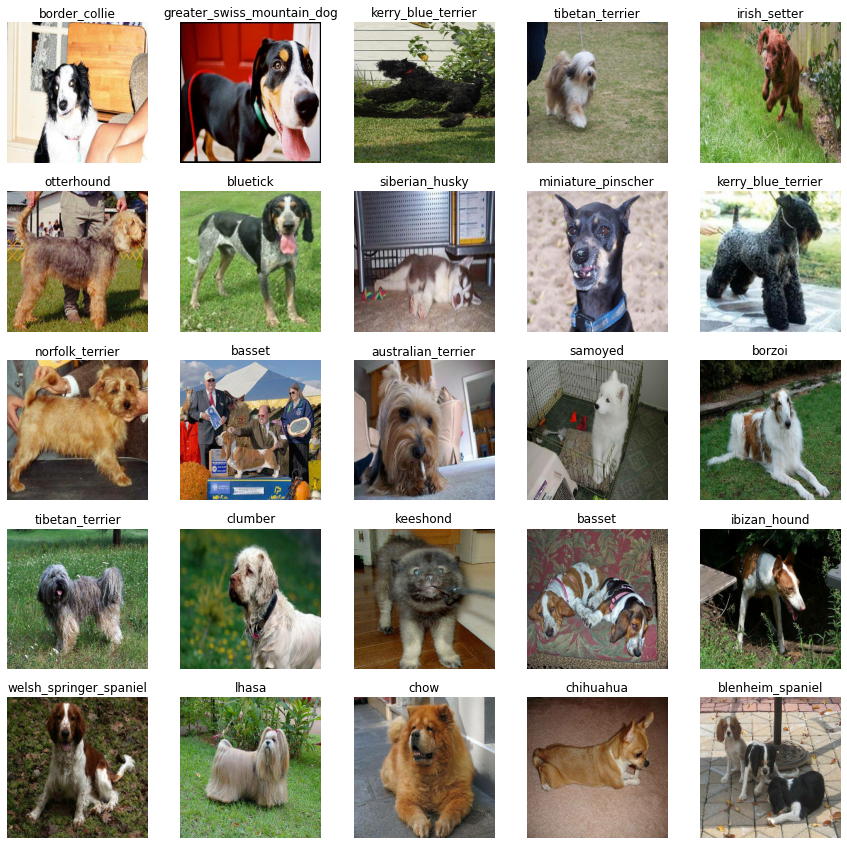

In [29]:
  # Now let's visualize our data in a training batch
  train_images, train_labels = next(train_data.as_numpy_iterator())
  show_25_images(train_images, train_labels)

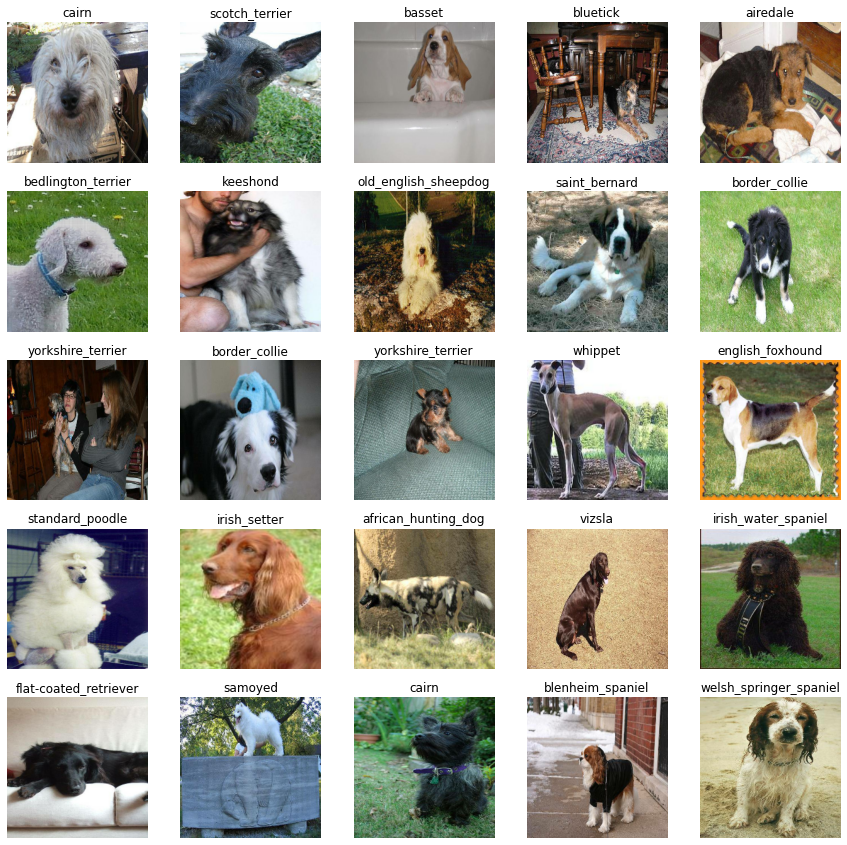

In [30]:
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [31]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Before we build a model, there are a few thing we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of our model we want to use from Tensorflow hub.

In [32]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow HUB
Model_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model! 

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found in tensorflow hub

In [33]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = Model_URL):
  print("Building model with:",model_url)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=output_shape, activation="softmax")
  ])
  #Compile a model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )
  #Build the model
  model.build(INPUT_SHAPE)
  return model

In [34]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callback

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for `TensorBoard` which helps track our models progress and another for early stopping which prevents our model from training too long.

### TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things:
1. Load the TensorBoard extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training) ✅

In [35]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [36]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensordoard_callback():
  # Create a log dircetory for storing a TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog vision/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [37]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [38]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [39]:
from tensorflow.python.framework.config import list_physical_devices
# check to make sure we're still running on a GPU
print("GPU", 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [40]:
# Build a function to train and return a trained model:
def train_model():
  """
  Training a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensordoard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data, 
            epochs=NUM_EPOCHS, 
            validation_data=valid_data, 
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # REturn the fitted model
  return model

In [41]:
y_val[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [42]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 164s 6s/step - loss: 4.5951 - accuracy: 0.0938 - val_loss: 3.3236 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 158ms/step - loss: 1.6382 - accuracy: 0.6938 - val_loss: 2.0755 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 161ms/step - loss: 0.5635 - accuracy: 0.9413 - val_loss: 1.6422 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 3s 139ms/step - loss: 0.2503 - accuracy: 0.9900 - val_loss: 1.4306 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 4s 141ms/step - loss: 0.1443 - accuracy: 0.9987 - val_loss: 1.3462 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 1.3113 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will acccess the logs directory we created earlier and visualize its contents.

In [43]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [44]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 112ms/step


array([[5.76322991e-03, 2.73478567e-04, 3.85516178e-04, ...,
        2.36369087e-03, 2.89595773e-05, 9.58796125e-03],
       [1.84090890e-03, 3.32006835e-03, 3.77428764e-03, ...,
        9.16182820e-04, 2.05897028e-04, 1.14233035e-03],
       [1.26386556e-04, 9.00889107e-04, 2.13290146e-03, ...,
        1.13753813e-04, 1.03350045e-04, 5.57018304e-03],
       ...,
       [5.71144346e-06, 6.23611340e-05, 1.86286605e-04, ...,
        5.15863176e-05, 1.00295423e-04, 1.10306348e-04],
       [5.33584924e-03, 9.86826723e-04, 3.44218162e-04, ...,
        1.98908441e-04, 2.82723722e-05, 1.49329538e-02],
       [9.67651838e-04, 2.93956618e-05, 1.00087526e-03, ...,
        2.69560399e-03, 5.35443367e-04, 1.95953267e-04]], dtype=float32)

In [45]:
predictions.shape

(200, 120)

In [46]:
len(y_val)

200

In [47]:
predictions[0]

array([5.76322991e-03, 2.73478567e-04, 3.85516178e-04, 1.01236445e-04,
       5.38997469e-04, 8.14859886e-05, 9.15726181e-03, 1.21355546e-03,
       5.04237178e-05, 4.18593001e-04, 2.70061049e-04, 9.42888437e-05,
       2.56733940e-04, 5.69003096e-05, 3.49003356e-04, 1.76701738e-04,
       4.61582204e-05, 2.23806411e-01, 4.56042799e-05, 2.42640835e-05,
       4.25173290e-04, 1.21738929e-04, 2.25892381e-05, 3.40303779e-03,
       5.82726061e-05, 3.32146243e-04, 8.59806985e-02, 2.82868830e-04,
       6.94261747e-04, 1.26039400e-03, 1.48026680e-04, 1.73919438e-03,
       2.56728102e-03, 1.57514623e-05, 4.85996803e-04, 6.61819382e-03,
       3.31925985e-05, 1.91673893e-03, 1.62532975e-04, 4.49633226e-05,
       6.16316684e-03, 5.13794621e-05, 5.75033700e-05, 1.07993466e-04,
       1.43806974e-04, 1.70528365e-04, 1.35661394e-04, 1.48334343e-03,
       6.17080892e-04, 1.28777872e-03, 3.19488317e-04, 1.79818322e-04,
       4.93763597e-04, 2.47832562e-04, 3.05090125e-05, 7.04477497e-05,
      

In [48]:
index = 42
print(predictions[index])
print(np.max(predictions[index]))
print(np.sum(predictions[index]))
print(np.argmax(predictions[index]))
print(unique_breeds[np.argmax(predictions[index])])

[1.41259487e-04 9.26583452e-05 1.57139119e-04 4.58923532e-05
 9.37823672e-04 2.82934721e-04 2.69471580e-04 5.67155599e-04
 5.51802758e-03 2.29061209e-02 6.27990521e-05 6.41147126e-05
 7.14202935e-04 1.38790417e-03 4.01176949e-04 1.70895283e-03
 5.43417773e-05 3.54324555e-04 2.32681938e-04 5.38092223e-04
 7.89443075e-05 5.67186624e-04 1.79970684e-05 3.24500288e-04
 2.50140904e-03 1.92523337e-04 2.90389416e-05 2.51248566e-04
 3.88626446e-04 1.99525384e-05 6.98741133e-05 1.58502720e-04
 1.05488849e-04 3.51497583e-05 5.75519116e-05 1.26010040e-04
 2.54988612e-04 2.41227943e-04 1.75108362e-04 2.69511312e-01
 2.19897498e-04 4.27300147e-05 8.97717138e-04 2.49723307e-05
 1.93575514e-04 3.91983303e-05 7.34502100e-05 7.18585041e-04
 8.77775310e-05 1.96420908e-04 8.26006435e-05 1.00912395e-04
 4.79799928e-04 1.21020991e-03 3.86473330e-05 6.04514033e-04
 5.57034800e-04 6.80669036e-05 9.08082948e-05 9.05619017e-05
 3.76720491e-05 1.41660959e-04 4.76781634e-06 7.73982993e-06
 2.48534168e-04 6.936711

Having the abobe functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [49]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on a array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions to the validation labels (truth labels)

In [54]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensor and returns separate arrays
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [51]:
get_pred_label(val_labels[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize 

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color
  if pred_label == true_label:
    color='green'
  else:
    color = 'red'

  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                    np.max(pred_prob)*100, 
                                    true_label), color=color)

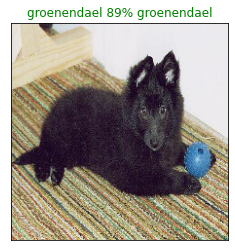

In [71]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images = val_images, n=77)

Now we've got one function to visualize ourmodels top prediction, let's make another to view our models top 10 prediction. 

This function will:
* Take an input of prediction probabilities array and a ground truth array and integer ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels
* Plot the top 10 prediction probability value and labelsm coloring true label green

In [79]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n.
  """
  pred_prob , true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes] 
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, color='red')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels, rotation='vertical')
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

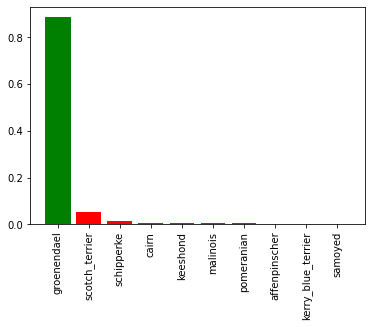

In [81]:
plot_pred_conf(predictions, val_labels, n=77)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out 

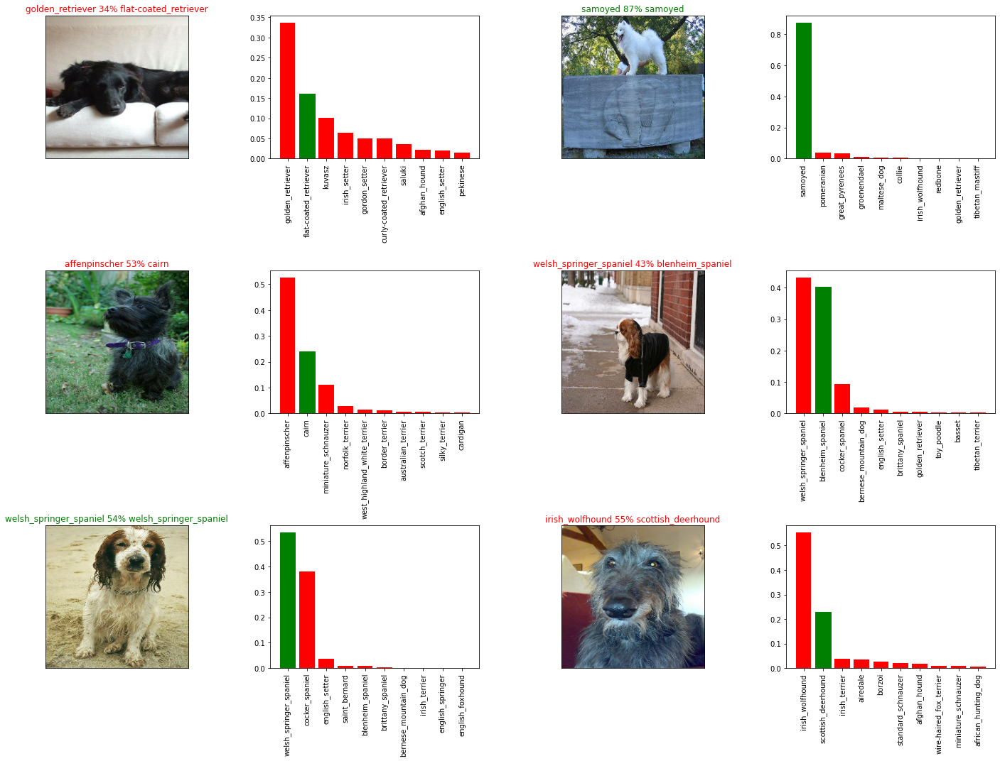

In [88]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,val_labels, val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [94]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  model_dir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog vision/models', datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = model_dir + "-" + suffix  +'.h5' 
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [91]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [95]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-17411673804484-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-17411673804484-1000-images-mobilenetv2-Adam.h5'

In [97]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-17411673804484-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: /content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-17411673804484-1000-images-mobilenetv2-Adam.h5...


In [98]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 117ms/step - loss: 1.2599 - accuracy: 0.6150


[1.2598949670791626, 0.6150000095367432]

In [99]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 102ms/step - loss: 1.2599 - accuracy: 0.6150


[1.2598949670791626, 0.6150000095367432]

## Training a big dog model on the full data

In [100]:
len(X), len(y)

(10222, 10222)

In [102]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [103]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [104]:
# Create a model for a full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [106]:
# Create full model callbacks
full_model_tensorboard = create_tensordoard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

**Note:** Running the cell below will take a little while (,aybe up to 30 minutes for the first epoch) because the PU we're using in the runtime has to load all of the images into memory.

In [108]:
# Fit the full model to the full data
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS, 
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 108ms/step - loss: 1.3470 - accuracy: 0.6681
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.3968 - accuracy: 0.8836
Epoch 3/100
320/320 [==============================] - 34s 104ms/step - loss: 0.2361 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1550 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1059 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0773 - accuracy: 0.9848
Epoch 7/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0598 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0454 - accuracy: 0.9957
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0382 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 34s 106m

In [109]:
full_model

In [110]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-18251673807134-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-18251673807134-full-image-set-mobilenetv2-Adam.h5'

In [117]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-18251673807134-full-image-set-mobilenetv2-Adam.h5')

Loading a saved model from: /content/drive/MyDrive/Colab Notebooks/Dog vision/models/20230115-18251673807134-full-image-set-mobilenetv2-Adam.h5...


## Making Prediction on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we create `create_data_batches()` earlier whcich can take a lsit of filenames as input and conert them into Tensor batches.

To make oredictions on the test data, we'll:
* Get the test image filenames ✅
* Convert filenames into test data batches using `create_data_batches()` and setting `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [119]:
# Load test image filenames
test_path = '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/'
test_filenames =  [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e0c11786a50ce49abdb71397d711ecc9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/dcdffa00518844bd21499db49979f9c8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e6b2cfafb8c0a06c062832369365fa9e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/df99a948e43d3399aff2e8ab2c18e184.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e757a7450559dc61a9261fe978e23b04.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e6c9d8058cbc9b1665aecac1ae179288.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/de3fbd6fb5444fcf14390ac90545c2f1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/test/e55fa0c818f485f8e36edfb464c4f129.jpg']

In [120]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [121]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()`  on our full model and passing it the test data batch will take a long time to run (about an ~1hr).

In [122]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 4192s 13s/step


In [125]:
np.savetxt('/content/drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv', test_predictions ,delimiter=',')

In [126]:
test_predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv', delimiter=',')

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to a Kaggle.

In [127]:
# Create a pandas DataFrame  with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [130]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2c0a9f66153b81eb27bb1bceb8c18dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e0c11786a50ce49abdb71397d711ecc9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcdffa00518844bd21499db49979f9c8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6b2cfafb8c0a06c062832369365fa9e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df99a948e43d3399aff2e8ab2c18e184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [131]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2c0a9f66153b81eb27bb1bceb8c18dd,1.073696e-09,5.548201e-08,9.545047e-09,2.679732e-07,2.921759e-10,3.569204e-07,3.952751e-06,7.053136e-10,4.640516e-12,...,1.169035e-09,5.902324e-08,7.022196e-10,6.055217e-07,1.029517e-09,1.178945e-10,2.057244e-10,2.356968e-07,3.110019e-04,1.006780e-07
1,e0c11786a50ce49abdb71397d711ecc9,1.660813e-07,4.452555e-08,9.023469e-11,1.866750e-07,7.202022e-06,8.216057e-05,1.995474e-05,1.628941e-07,6.453914e-07,...,9.032089e-07,1.200788e-09,9.938277e-08,6.022242e-07,6.046152e-09,1.070733e-05,6.182348e-07,3.160716e-11,2.768782e-07,8.251378e-04
2,dcdffa00518844bd21499db49979f9c8,3.868272e-10,1.641023e-12,8.348820e-13,3.047304e-11,4.024512e-06,8.492589e-05,8.191635e-09,9.996216e-01,2.977899e-08,...,8.106464e-08,9.802477e-09,2.812570e-08,1.652054e-11,3.712741e-12,1.908320e-09,6.893333e-11,1.994635e-08,6.321419e-08,1.810084e-12
3,e6b2cfafb8c0a06c062832369365fa9e,1.369960e-09,3.713372e-11,2.645880e-09,1.627725e-08,2.770945e-03,2.580437e-04,1.635415e-08,3.658207e-04,4.674634e-05,...,6.492710e-09,1.463294e-06,5.252975e-09,4.873287e-02,1.635514e-08,5.717169e-06,1.531812e-08,3.131753e-06,5.447087e-04,1.927647e-06
4,df99a948e43d3399aff2e8ab2c18e184,2.776806e-09,3.076532e-12,1.516362e-12,2.398456e-04,9.379649e-10,6.459071e-11,1.899754e-12,6.554029e-12,2.821959e-10,...,2.563237e-09,3.286830e-11,4.569538e-11,1.438604e-08,2.397721e-11,1.311490e-10,1.227921e-09,9.468864e-09,5.451232e-06,1.089475e-09


In [132]:
preds_df.to_csv('/content/drive/MyDrive/Colab Notebooks/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

## Making predictions on custome images

To make oredictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [151]:
# Get file path
custom_path = '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [152]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/pasha_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/farrukh_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/komiljon_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/alfina_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/mal_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/abu_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/amir_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/amir_dog_1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/said_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/farrukh_dog_1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/oyboy_dog.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog vision/personal-photos/gay

In [153]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [154]:
# Make predictions
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 679ms/step


In [155]:
custom_preds.shape

(13, 120)

In [156]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['gordon_setter',
 'greater_swiss_mountain_dog',
 'miniature_pinscher',
 'yorkshire_terrier',
 'eskimo_dog',
 'pug',
 'pomeranian',
 'lhasa',
 'eskimo_dog',
 'miniature_poodle',
 'english_foxhound',
 'miniature_pinscher',
 'eskimo_dog']

In [157]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

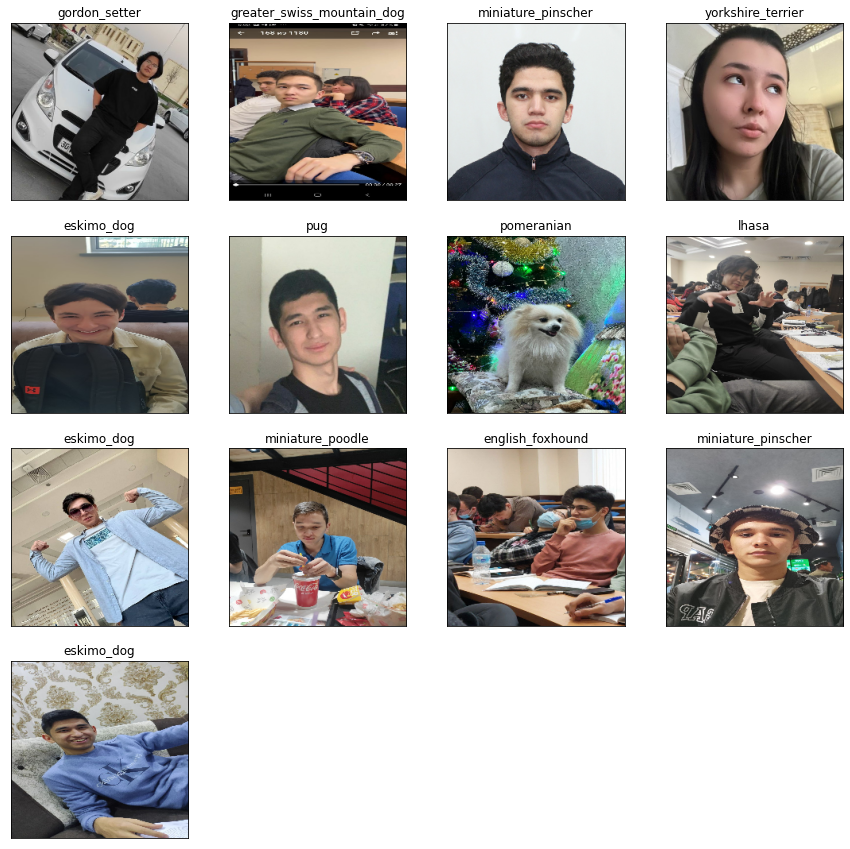

In [159]:
plt.figure(figsize=(15,15))
for i, image in enumerate(custom_images):
  plt.subplot(4,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)